In [1]:
import base64
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import plotly.graph_objects as go
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F

from dash import Dash, dcc, html, Input, Output, no_update, callback
from PIL import Image
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
METADATA_PATH = "features/data.csv"
IMAGES_DIR = "features/images"
IDS_PATH = "features/ids.npy"
IMAGE_FEATURES_PATH = "features/image_features.npy"
TITLE_FEATURES_PATH = "features/title_features.npy"

In [3]:
metadata = pd.read_csv(METADATA_PATH)
ids = np.load(IDS_PATH)
image_features = np.load(IMAGE_FEATURES_PATH)
title_features = np.load(TITLE_FEATURES_PATH)

In [4]:
image_features.shape

(3926, 2560)

In [5]:
title_features.shape

(3926, 768)

# Visualize embeddings in t-SNE

In [6]:
image_tsne = TSNE(n_components=2, perplexity=30, metric="cosine").fit_transform(image_features)
title_tsne = TSNE(n_components=2, perplexity=30, metric="cosine").fit_transform(title_features)

In [7]:
def encode_image(image_path):
    with open(image_path, "rb") as img_file:
        return "data:image/jpg;base64," + base64.b64encode(img_file.read()).decode("ascii")
titles = metadata["title"].to_list()
image_paths = list(map(lambda idx : os.path.join(IMAGES_DIR, idx + ".jpg"), ids))
image_base64 = list(map(encode_image, image_paths))

In [8]:
def display_tsne_interactive(tsne, titles, images):
    @callback(
        Output("graph-tooltip", "show"),
        Output("graph-tooltip", "bbox"),
        Output("graph-tooltip", "children"),
        Input("graph", "hoverData"),
    )
    def display_hover(hoverData):
        if hoverData is None:
            return False, no_update, no_update

        hover_data = hoverData["points"][0]
        bbox = hover_data["bbox"]
        index = hover_data["pointNumber"]
        children = [
            html.Div([
                html.Div(titles[index]),
                html.Img(
                    src=images[index],
                    style={"width": "150px"},
                )
            ])
        ]
    
        return True, bbox, children

    fig = go.Figure(data=[go.Scatter(
        x=tsne[:, 0],
        y=tsne[:, 1],
        mode='markers',
        marker=dict(
            size=5,
            sizemode="diameter",
            opacity=0.8,
        )
    )])
    fig.update_traces(
        hoverinfo="none",
        hovertemplate=None,
    )
    fig.update_layout(
        width=600,
        height=600,
        xaxis=dict(scaleanchor="y"),
        yaxis=dict(scaleanchor="x"),
        margin=dict(l=0, r=0, t=0, b=0),
    )
    
    app = Dash()
    app.layout = html.Div(
        children=[
            dcc.Graph(id="graph",
                      figure=fig,
                      clear_on_unhover=True,
                      style={"width": "80vw", "height": "80vh"}),
            dcc.Tooltip(id="graph-tooltip"),
        ],
    )
    app.run()

In [9]:
display_tsne_interactive(image_tsne, titles, image_base64)

In [10]:
display_tsne_interactive(title_tsne, titles, image_base64)

The graphs above will show image and title when hovering on the point. Title embeddings seem to be better at grouping similar images together.

In [11]:
image_sim = cosine_similarity(image_features)
title_sim = cosine_similarity(title_features)
correlation = np.corrcoef(image_sim.flatten(), title_sim.flatten())[0, 1]
print(f"Correlation between image and title similarity: {correlation:.3f}")

Correlation between image and title similarity: 0.058


Image and title similarities are not much correlated.

# Example retrieval task
Give a query painting, return the most similar 3 paintings.

In [12]:
def read_image(idx):
    return Image.open(os.path.join(IMAGES_DIR, metadata.loc[idx, "id"] + ".jpg"))

def retrieve_similar_images(query_index, features, method):
    embedding = features[query_index]
    similarity = cosine_similarity(embedding.reshape(1, -1), features)
    sorted_indices = np.argsort(similarity[0])[::-1]
    top_3_results = sorted_indices[sorted_indices != query_index][:3]

    query_image = read_image(query_index)
    similar_images = [read_image(idx) for idx in top_3_results]

    fig, axes = plt.subplots(1, 4, figsize=(12, 3))

    # Row 1: Image-based similarity
    axes[0].imshow(query_image)
    axes[0].set_title("Query Image")
    axes[0].axis("off")
    
    for i, img in enumerate(similar_images):
        axes[i + 1].imshow(img)
        axes[i + 1].set_title(f"Similar by {method} Top {i+1}")
        axes[i + 1].axis("off")
    
    plt.tight_layout()
    plt.show()

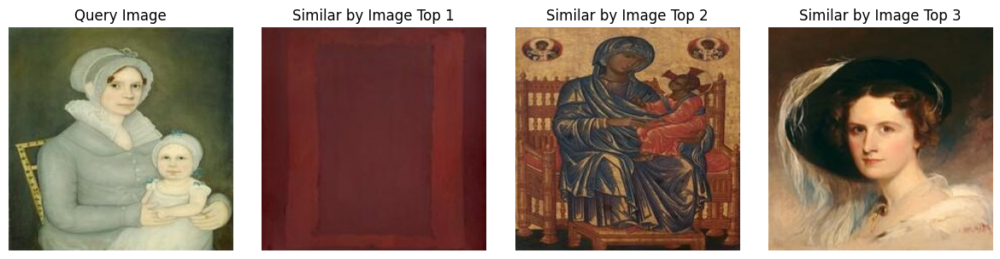

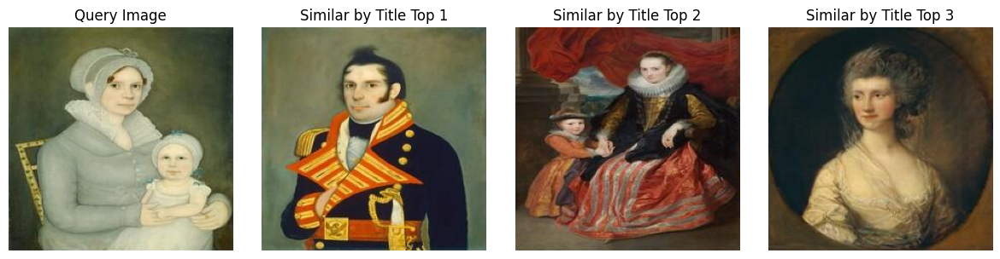

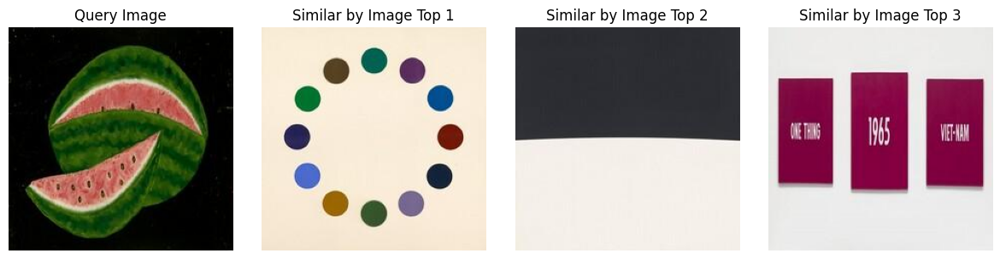

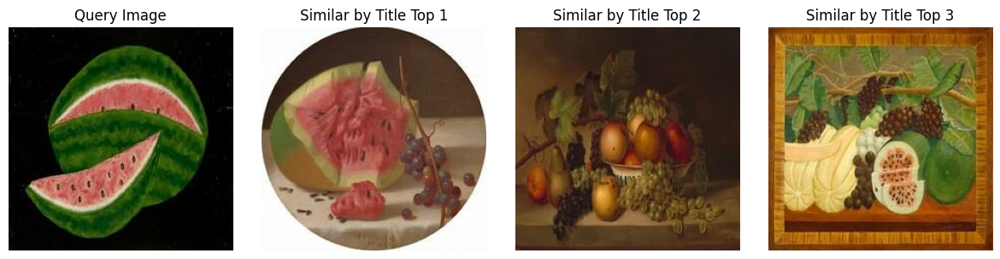

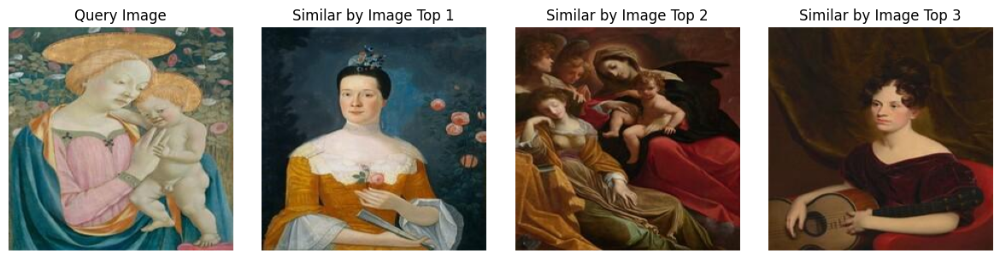

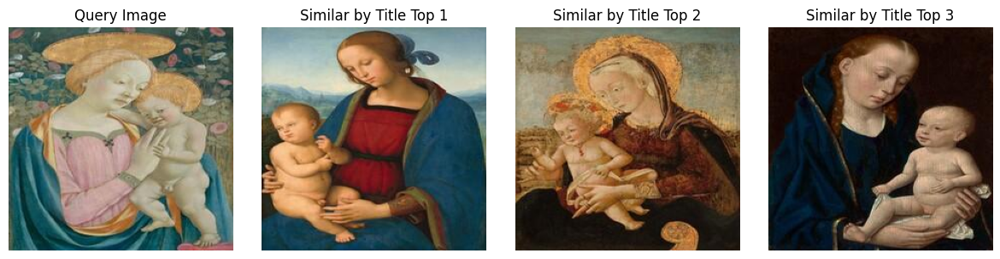

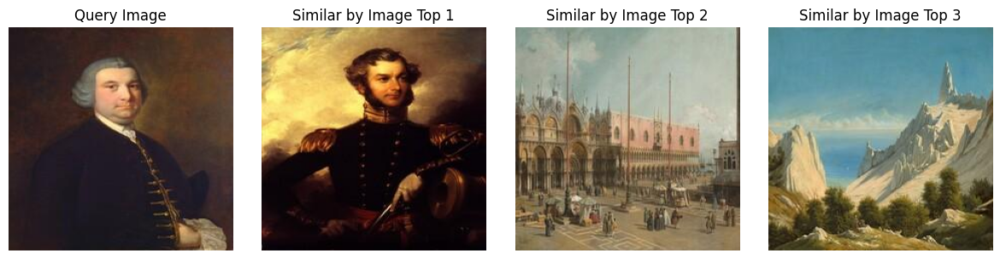

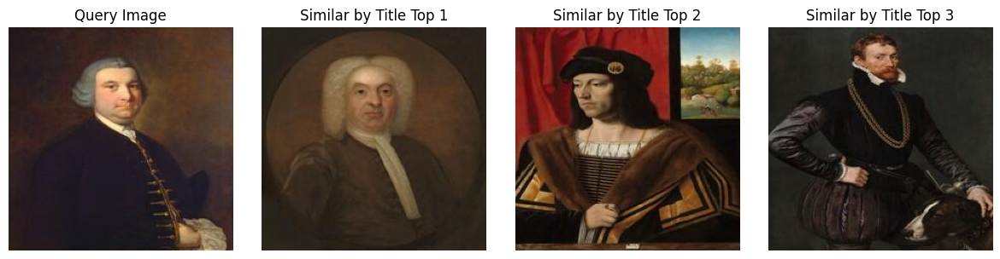

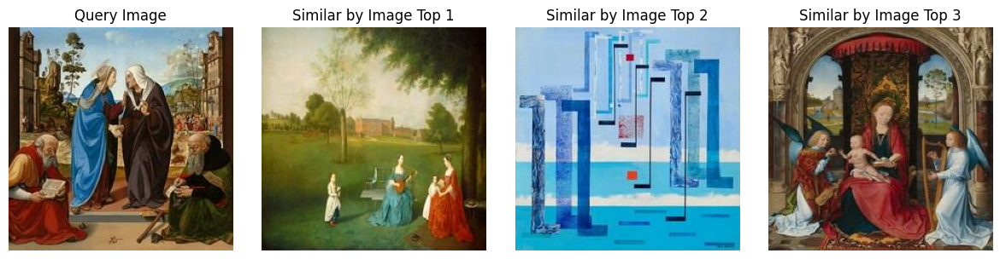

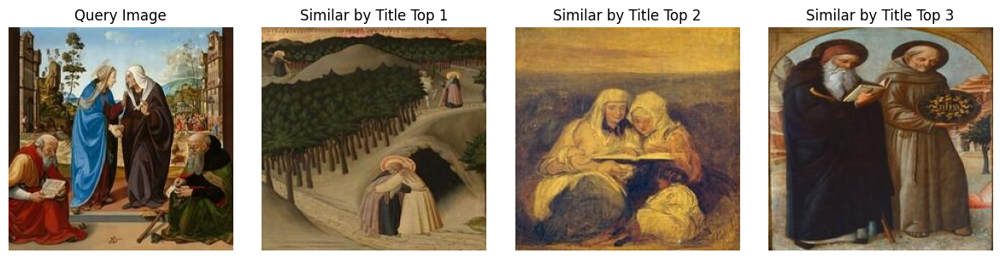

In [13]:
np.random.seed(45)
query_indices = [np.random.randint(len(metadata)) for _ in range(5)]
for query_index in query_indices:
    retrieve_similar_images(query_index, image_features, "Image")
    retrieve_similar_images(query_index, title_features, "Title")

Sometimes title-based retrieval is better, sometimes image-based is better. But overall title-based seems better from a few manual inspections.

# Siamese network

We can use title embeddings to create proxy labels for similar pairs, and fine-tune the image encoders to improve the similarity retrieval task.

Since it's hard to train EfficientNet-b7 on CPU, I'm training a simple FC layer on top of EfficientNet-b7 features instead.

### Create positive / negative pairs

In [14]:
title_sim = cosine_similarity(title_features)

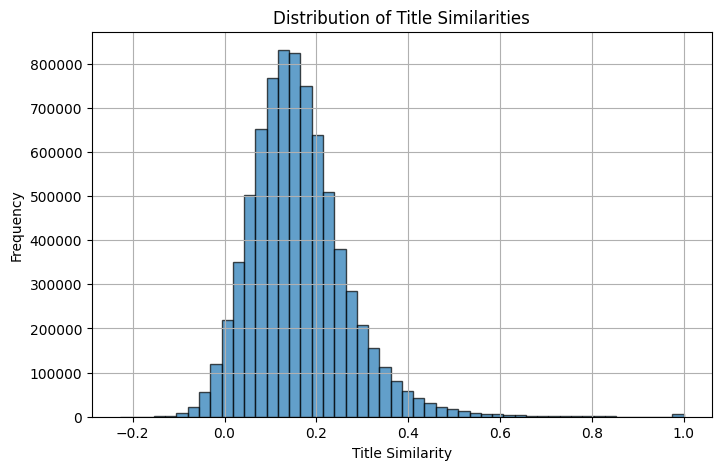

In [15]:
title_sim_flat = title_sim[np.triu_indices_from(title_sim, k=1)]  # k=1 excludes diagonal

plt.figure(figsize=(8, 5))
plt.hist(title_sim_flat, bins=50, alpha=0.7, edgecolor="black")

plt.xlabel("Title Similarity")
plt.ylabel("Frequency")
plt.title("Distribution of Title Similarities")
plt.grid(True)

plt.show()

In [16]:
title_sim = cosine_similarity(title_features)
pos_threshold = 0.6
neg_threshold = -0.05

positive_pairs = np.vstack(np.where(title_sim > pos_threshold))
# Remove duplicate pairs
positive_pairs = positive_pairs[:, positive_pairs[0] < positive_pairs[1]]
positive_pairs = positive_pairs.T

negative_pairs = np.vstack(np.where(title_sim < neg_threshold))
# Remove duplicate pairs
negative_pairs = negative_pairs[:, negative_pairs[0] < negative_pairs[1]]
negative_pairs = negative_pairs.T

print(f"Positive Pairs: {len(positive_pairs)}")
print(f"Negative Pairs: {len(negative_pairs)}")

Positive Pairs: 26366
Negative Pairs: 41743


### Siamese network

In [17]:
class SiameseNetwork(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(SiameseNetwork, self).__init__()
        self.fc = nn.Linear(input_dim, output_dim)

    def forward(self, x1, x2):
        f1 = self.fc(x1)  # For image 1
        f2 = self.fc(x2)  # For image 2
        return f1, f2

    def get_features(self, x):
        return self.fc(x)

class CosineContrastiveLoss(nn.Module):
    def __init__(self, margin=0.5):
        super(CosineContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, f1, f2, label):
        cosine_dist = 1 - F.cosine_similarity(f1, f2)
        loss = (1 - label) * cosine_dist.pow(2) + label * torch.clamp(self.margin - cosine_dist, min=0).pow(2)
        return loss.mean()

In [18]:
INPUT_DIM = 2560
OUTPUT_DIM = 2560
MARGIN = 0
NUM_EPOCHS = 50
LEARNING_RATE = 3e-5
BATCH_SIZE = 5000

torch_features = torch.tensor(image_features)

model = SiameseNetwork(INPUT_DIM, OUTPUT_DIM)
loss_func = CosineContrastiveLoss(MARGIN)
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [19]:
for epoch in range(NUM_EPOCHS):
    positive_sample = np.random.choice(len(positive_pairs), BATCH_SIZE, replace=False)
    negative_sample = np.random.choice(len(negative_pairs), BATCH_SIZE, replace=False)
    pairs = torch.tensor(np.vstack((
        positive_pairs[positive_sample], negative_pairs[negative_sample]
    )))
    labels = torch.tensor(np.vstack((
        np.zeros(BATCH_SIZE).reshape(-1, 1),
        np.ones(BATCH_SIZE).reshape(-1, 1)
    )))
    input1 = torch_features[pairs[:,0]]
    input2 = torch_features[pairs[:,1]]
    f1, f2 = model(input1, input2)
    loss = loss_func(f1, f2, labels)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    print(f"Epoch {epoch + 1}, loss={loss.item()}")

Epoch 1, loss=0.4655334410995245
Epoch 2, loss=0.45784962206333873
Epoch 3, loss=0.45492617621049286
Epoch 4, loss=0.44872121574655177
Epoch 5, loss=0.44521415717229246
Epoch 6, loss=0.4424667737983167
Epoch 7, loss=0.43643955434560777
Epoch 8, loss=0.4327419053815305
Epoch 9, loss=0.42797520854566246
Epoch 10, loss=0.42452661902569233
Epoch 11, loss=0.4188857344606891
Epoch 12, loss=0.4156635520130396
Epoch 13, loss=0.41314298109347003
Epoch 14, loss=0.4103469841832295
Epoch 15, loss=0.40421479248255493
Epoch 16, loss=0.40062444995893165
Epoch 17, loss=0.3981346835944802
Epoch 18, loss=0.3947177860984113
Epoch 19, loss=0.393929157675663
Epoch 20, loss=0.38884564872742633
Epoch 21, loss=0.3838959901087685
Epoch 22, loss=0.38302850651028564
Epoch 23, loss=0.3809949108065106
Epoch 24, loss=0.37945924064330755
Epoch 25, loss=0.37667341730271
Epoch 26, loss=0.3725386033746414
Epoch 27, loss=0.36881682574576696
Epoch 28, loss=0.36974881481868216
Epoch 29, loss=0.3628416472210316
Epoch 30, l

# Evaluate the model

In [20]:
with torch.no_grad():
    updated_image_features = model.get_features(torch_features).numpy()

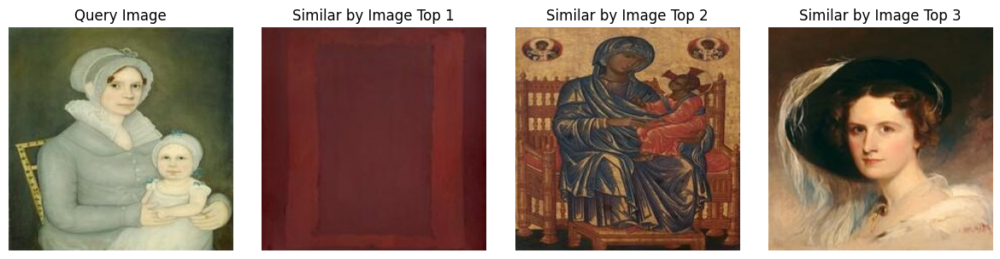

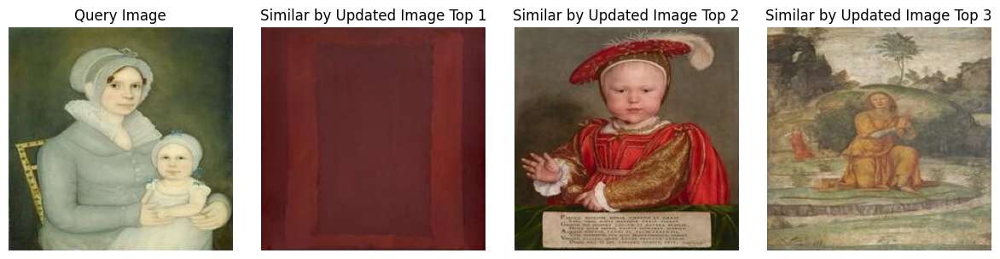

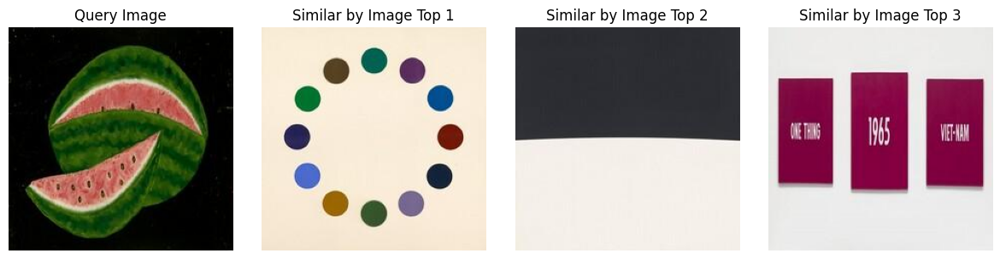

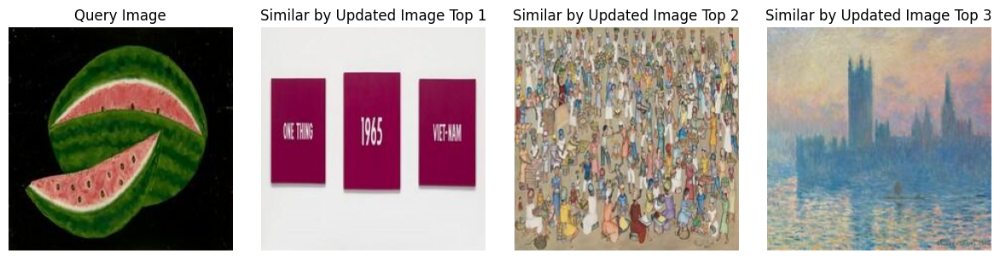

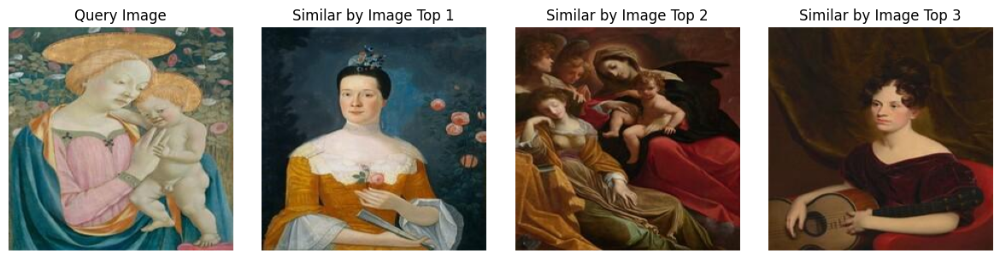

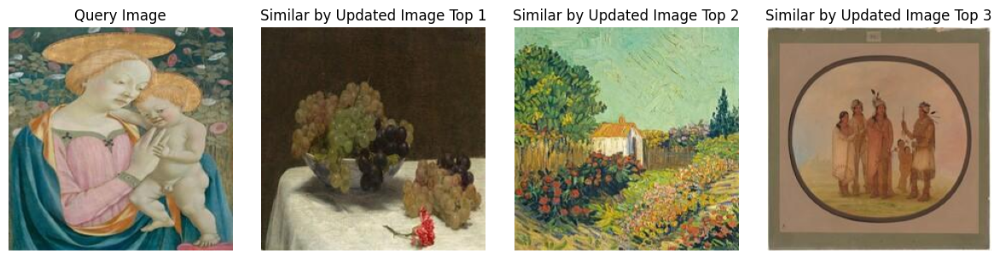

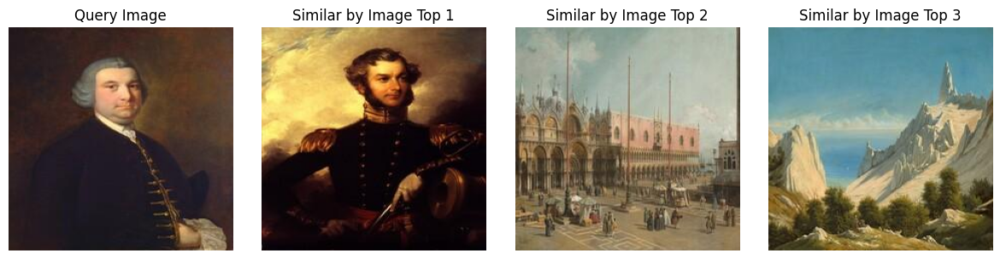

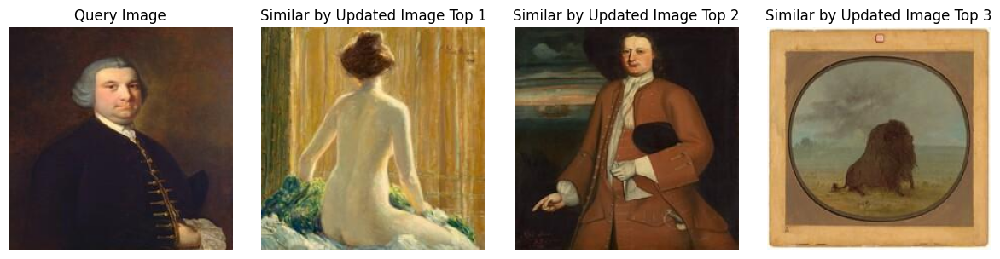

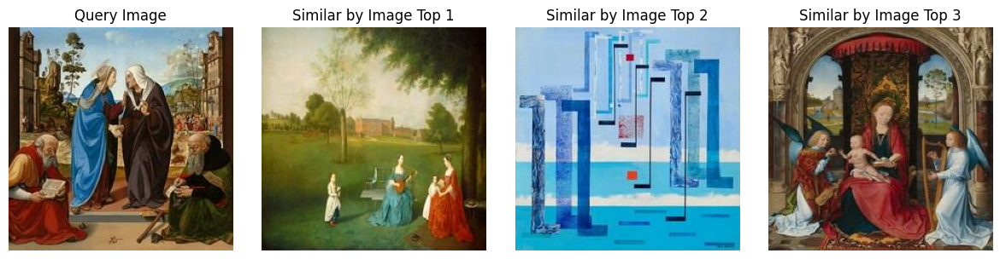

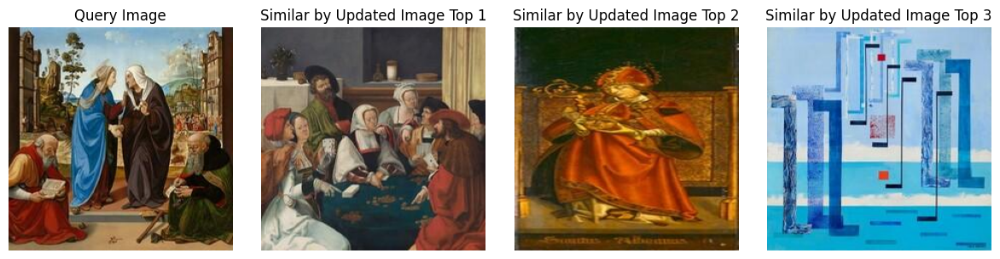

In [21]:
for query_index in query_indices:
    retrieve_similar_images(query_index, image_features, "Image")
    retrieve_similar_images(query_index, updated_image_features, "Updated Image")

Some minor improvements and some degradation, that's probably because the ground-truth we trained on (i.e., similarity based on titles) is noisy.